> https://drive.google.com/file/d/1DxVtuRqeA8JN4wNWos14eTx5eKMtvEqs/view



## Explanation of Thyroid Detection Terms

### Negative
Indicates the absence of any thyroid disease.

### Binding Protein Related
- **Increased Binding Protein:** High levels of thyroid-binding globulin (TBG) in blood.
- **Decreased Binding Protein:** Low levels of TBG in blood.

### Hypothyroidism
- **Compensated Hypothyroidism:** TSH levels are high but thyroid hormone levels are within normal range.
- **Primary Hypothyroidism:** Caused by a dysfunction of the thyroid gland itself.
- **Secondary Hypothyroidism:** Caused by a malfunction in the pituitary gland or hypothalamus.

### Hyperthyroidism
- **Hyperthyroidism:** Overactive thyroid gland.
- **T Toxic:** Presence of antibodies that stimulate the thyroid gland to produce too much thyroid hormone.

### Goitre
Enlargement of the thyroid gland.

### Replacement Therapy
- **Replacement Therapy:** Refers to the treatment of hypothyroidism with thyroid hormone replacement drugs.
- **Underreplacement:** Insufficient thyroid hormone replacement.
- **Overreplacement:** Excessive thyroid hormone replacement.

### Sick
Thyroid function is affected by an underlying medical condition.

### Discordant
Results of thyroid tests are inconsistent or do not match clinical symptoms.


| Grouped Category | Target Variables |
| ---------------- | ---------------- |
| Negative         | negative         |
| Binding Protein  | increased binding protein<br>decreased binding protein |
| Hypothyroidism   | compensated hypothyroid<br>primary hypothyroid<br>secondary hypothyroid |
| Hyperthyroidism  | hyperthyroid<br>T toxic<br>secondary toxic |
| Goitre           | goitre           |
| Replacement      | replacement therapy<br>underreplacement<br>overreplacement |
| Sick             | sick             |
| Discordant       | discordant       |


# Data Ingestion

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.utils import resample
from imblearn.over_sampling import SMOTENC,RandomOverSampler,KMeansSMOTE
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder
#sns.set()

In [2]:
pd.set_option('display.max_columns', None)

In [3]:

allbp = pd.read_csv("allbp/allbp.data",header=None)

allbp.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,41,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,1.3,t,2.5,t,125,t,1.14,t,109,f,?,SVHC,negative.|3733
1,23,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.1,t,2,t,102,f,?,f,?,f,?,other,negative.|1442
2,46,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.98,f,?,t,109,t,0.91,t,120,f,?,other,negative.|2965
3,70,F,t,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.16,t,1.9,t,175,f,?,f,?,f,?,other,negative.|806
4,70,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.72,t,1.2,t,61,t,0.87,t,70,f,?,SVI,negative.|2807


In [4]:

allbp_test = pd.read_csv("allbp/allbp.test",header=None)

allbp_test.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,35,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,f,?,f,?,f,?,f,?,f,?,f,?,other,negative.|219
1,63,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,3.5,t,2.5,t,108,t,0.96,t,113,f,?,SVI,negative.|2059
2,25,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.6,t,2.4,t,61,t,0.82,t,75,f,?,SVHD,negative.|399
3,53,F,f,f,f,f,f,f,f,t,f,f,f,f,f,f,t,0.25,t,2.1,t,145,t,1.03,t,141,f,?,other,negative.|1911
4,92,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.7,t,1.3,t,120,t,0.84,t,143,f,?,SVI,negative.|487


In [5]:
allhyper = pd.read_csv("allhyper/allhyper.data",header=None)

allhyper.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,41,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,1.3,t,2.5,t,125,t,1.14,t,109,f,?,SVHC,negative.|3733
1,23,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.1,t,2,t,102,f,?,f,?,f,?,other,negative.|1442
2,46,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.98,f,?,t,109,t,0.91,t,120,f,?,other,negative.|2965
3,70,F,t,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.16,t,1.9,t,175,f,?,f,?,f,?,other,negative.|806
4,70,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.72,t,1.2,t,61,t,0.87,t,70,f,?,SVI,negative.|2807


In [6]:
allhyper_test = pd.read_csv("allhyper/allhyper.test",header=None)

allhyper_test.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,35,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,f,?,f,?,f,?,f,?,f,?,f,?,other,negative.|219
1,63,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,3.5,t,2.5,t,108,t,0.96,t,113,f,?,SVI,negative.|2059
2,25,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.6,t,2.4,t,61,t,0.82,t,75,f,?,SVHD,negative.|399
3,53,F,f,f,f,f,f,f,f,t,f,f,f,f,f,f,t,0.25,t,2.1,t,145,t,1.03,t,141,f,?,other,negative.|1911
4,92,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.7,t,1.3,t,120,t,0.84,t,143,f,?,SVI,negative.|487


In [7]:
allrep = pd.read_csv("allrep/allrep.data",header=None)

allrep.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,41,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,1.3,t,2.5,t,125,t,1.14,t,109,f,?,SVHC,negative.|3733
1,23,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.1,t,2,t,102,f,?,f,?,f,?,other,negative.|1442
2,46,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.98,f,?,t,109,t,0.91,t,120,f,?,other,negative.|2965
3,70,F,t,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.16,t,1.9,t,175,f,?,f,?,f,?,other,replacement therapy.|806
4,70,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.72,t,1.2,t,61,t,0.87,t,70,f,?,SVI,negative.|2807


In [8]:
allrep_test = pd.read_csv("allrep/allrep.test",header=None)

allrep_test.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,35,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,f,?,f,?,f,?,f,?,f,?,f,?,other,negative.|219
1,63,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,3.5,t,2.5,t,108,t,0.96,t,113,f,?,SVI,negative.|2059
2,25,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.6,t,2.4,t,61,t,0.82,t,75,f,?,SVHD,negative.|399
3,53,F,f,f,f,f,f,f,f,t,f,f,f,f,f,f,t,0.25,t,2.1,t,145,t,1.03,t,141,f,?,other,negative.|1911
4,92,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.7,t,1.3,t,120,t,0.84,t,143,f,?,SVI,negative.|487


In [9]:
allhypo = pd.read_csv("allhypo/allhypo.data",header=None)

allhypo.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,41,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,1.3,t,2.5,t,125,t,1.14,t,109,f,?,SVHC,negative.|3733
1,23,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.1,t,2,t,102,f,?,f,?,f,?,other,negative.|1442
2,46,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.98,f,?,t,109,t,0.91,t,120,f,?,other,negative.|2965
3,70,F,t,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.16,t,1.9,t,175,f,?,f,?,f,?,other,negative.|806
4,70,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.72,t,1.2,t,61,t,0.87,t,70,f,?,SVI,negative.|2807


In [10]:
allhypo_test = pd.read_csv("allhypo/allhypo.test",header=None)

allhypo_test.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,35,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,f,?,f,?,f,?,f,?,f,?,f,?,other,negative.|219
1,63,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,3.5,t,2.5,t,108,t,0.96,t,113,f,?,SVI,negative.|2059
2,25,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.6,t,2.4,t,61,t,0.82,t,75,f,?,SVHD,negative.|399
3,53,F,f,f,f,f,f,f,f,t,f,f,f,f,f,f,t,0.25,t,2.1,t,145,t,1.03,t,141,f,?,other,negative.|1911
4,92,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.7,t,1.3,t,120,t,0.84,t,143,f,?,SVI,negative.|487


In [11]:
sick = pd.read_csv("sick/sick.data",header=None,skiprows=0)

sick.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,41,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,1.3,t,2.5,t,125,t,1.14,t,109,f,?,SVHC,negative.|3733
1,23,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.1,t,2,t,102,f,?,f,?,f,?,other,negative.|1442
2,46,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.98,f,?,t,109,t,0.91,t,120,f,?,other,negative.|2965
3,70,F,t,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.16,t,1.9,t,175,f,?,f,?,f,?,other,negative.|806
4,70,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.72,t,1.2,t,61,t,0.87,t,70,f,?,SVI,negative.|2807


In [12]:
sick_test = pd.read_csv("sick/sick.test",header=None,skiprows=0)

sick_test.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,35,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,f,?,f,?,f,?,f,?,f,?,f,?,other,negative.|219
1,63,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,3.5,t,2.5,t,108,t,0.96,t,113,f,?,SVI,negative.|2059
2,25,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.6,t,2.4,t,61,t,0.82,t,75,f,?,SVHD,negative.|399
3,53,F,f,f,f,f,f,f,f,t,f,f,f,f,f,f,t,0.25,t,2.1,t,145,t,1.03,t,141,f,?,other,negative.|1911
4,92,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.7,t,1.3,t,120,t,0.84,t,143,f,?,SVI,negative.|487


In [13]:
dis = pd.read_csv("dis/dis.data",header=None,skiprows=0)

dis.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,41,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,1.3,t,2.5,t,125,t,1.14,t,109,f,?,SVHC,negative.|3733
1,23,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.1,t,2,t,102,f,?,f,?,f,?,other,negative.|1442
2,46,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.98,f,?,t,109,t,0.91,t,120,f,?,other,negative.|2965
3,70,F,t,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.16,t,1.9,t,175,f,?,f,?,f,?,other,negative.|806
4,70,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.72,t,1.2,t,61,t,0.87,t,70,f,?,SVI,negative.|2807


In [14]:
dis_test = pd.read_csv("dis/dis.test",header=None,skiprows=0)

dis_test.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,35,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,f,?,f,?,f,?,f,?,f,?,f,?,other,negative.|219
1,63,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,3.5,t,2.5,t,108,t,0.96,t,113,f,?,SVI,negative.|2059
2,25,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.6,t,2.4,t,61,t,0.82,t,75,f,?,SVHD,negative.|399
3,53,F,f,f,f,f,f,f,f,t,f,f,f,f,f,f,t,0.25,t,2.1,t,145,t,1.03,t,141,f,?,other,negative.|1911
4,92,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.7,t,1.3,t,120,t,0.84,t,143,f,?,SVI,negative.|487


In [15]:
df_combined = pd.concat([allbp, allbp_test, allhypo, allhypo_test, allhyper, allhyper_test, allrep, allrep_test ,sick, sick_test,dis, dis_test],axis=0)
df_combined.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
0,41,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,1.3,t,2.5,t,125,t,1.14,t,109,f,?,SVHC,negative.|3733
1,23,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.1,t,2,t,102,f,?,f,?,f,?,other,negative.|1442
2,46,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.98,f,?,t,109,t,0.91,t,120,f,?,other,negative.|2965
3,70,F,t,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.16,t,1.9,t,175,f,?,f,?,f,?,other,negative.|806
4,70,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.72,t,1.2,t,61,t,0.87,t,70,f,?,SVI,negative.|2807


In [16]:
columns_list = ['age',
                 'sex',
                 'on_thyroxine',
                 'query_on_thyroxine',
                 'on_antithyroid_medication',
                 'sick',
                 'pregnant',
                 'thyroid_surgery',
                 'I131_treatment',
                 'query_hypothyroid',
                 'query_hyperthyroid',
                 'lithium',
                 'goitre',
                 'tumor',
                 'hypopituitary',
                 'psych',
                 'TSH_measured',
                 'TSH',
                 'T3_measured',
                 'T3',
                 'TT4_measured',
                 'TT4',
                 'T4U_measured',
                 'T4U',
                 'FTI_measured',
                 'FTI',
                 'TBG_measured',
                 'TBG',
                 'referral_source',
                 'Class']

In [17]:
df_combined.columns = columns_list

df_combined.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH_measured,TSH,T3_measured,T3,TT4_measured,TT4,T4U_measured,T4U,FTI_measured,FTI,TBG_measured,TBG,referral_source,Class
0,41,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,1.3,t,2.5,t,125,t,1.14,t,109,f,?,SVHC,negative.|3733
1,23,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.1,t,2,t,102,f,?,f,?,f,?,other,negative.|1442
2,46,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.98,f,?,t,109,t,0.91,t,120,f,?,other,negative.|2965
3,70,F,t,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.16,t,1.9,t,175,f,?,f,?,f,?,other,negative.|806
4,70,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.72,t,1.2,t,61,t,0.87,t,70,f,?,SVI,negative.|2807


In [18]:
df_combined['hypopituitary'].unique()



array(['f', 't'], dtype=object)

# Data Cleaning

In [19]:
df_combined.duplicated().sum()

17891

In [20]:
df_combined.drop_duplicates(inplace=True)

In [21]:
df_combined.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH_measured,TSH,T3_measured,T3,TT4_measured,TT4,T4U_measured,T4U,FTI_measured,FTI,TBG_measured,TBG,referral_source,Class
0,41,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,1.3,t,2.5,t,125,t,1.14,t,109,f,?,SVHC,negative.|3733
1,23,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.1,t,2,t,102,f,?,f,?,f,?,other,negative.|1442
2,46,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.98,f,?,t,109,t,0.91,t,120,f,?,other,negative.|2965
3,70,F,t,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.16,t,1.9,t,175,f,?,f,?,f,?,other,negative.|806
4,70,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.72,t,1.2,t,61,t,0.87,t,70,f,?,SVI,negative.|2807


In [22]:
df_combined.duplicated().sum()

0

In [23]:
df_combined.describe()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH_measured,TSH,T3_measured,T3,TT4_measured,TT4,T4U_measured,T4U,FTI_measured,FTI,TBG_measured,TBG,referral_source,Class
count,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741,4741
unique,175,3,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,288,2,70,2,242,2,147,2,235,1,1,5,4741
top,59,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,?,t,?,t,?,t,?,t,?,f,?,other,negative.|3733
freq,99,3184,4119,4677,4688,4549,4647,4682,4669,4410,4421,4721,4703,4609,4739,4535,4348,393,3840,901,4504,237,4307,434,4309,432,4741,4741,2703,1


In [24]:
df_combined.columns

Index(['age', 'sex', 'on_thyroxine', 'query_on_thyroxine',
       'on_antithyroid_medication', 'sick', 'pregnant', 'thyroid_surgery',
       'I131_treatment', 'query_hypothyroid', 'query_hyperthyroid', 'lithium',
       'goitre', 'tumor', 'hypopituitary', 'psych', 'TSH_measured', 'TSH',
       'T3_measured', 'T3', 'TT4_measured', 'TT4', 'T4U_measured', 'T4U',
       'FTI_measured', 'FTI', 'TBG_measured', 'TBG', 'referral_source',
       'Class'],
      dtype='object')

In [25]:
df_combined["Class"].replace(to_replace= r"[.|0-9]",value="", regex=True, inplace=True)

In [26]:
df_combined.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH_measured,TSH,T3_measured,T3,TT4_measured,TT4,T4U_measured,T4U,FTI_measured,FTI,TBG_measured,TBG,referral_source,Class
0,41,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,1.3,t,2.5,t,125,t,1.14,t,109,f,?,SVHC,negative
1,23,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,4.1,t,2,t,102,f,?,f,?,f,?,other,negative
2,46,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.98,f,?,t,109,t,0.91,t,120,f,?,other,negative
3,70,F,t,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.16,t,1.9,t,175,f,?,f,?,f,?,other,negative
4,70,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,t,0.72,t,1.2,t,61,t,0.87,t,70,f,?,SVI,negative


In [27]:
df_combined_orig = df_combined.copy()

# Revealing Missing Values

In [28]:
df_combined.isnull().sum()

age                          0
sex                          0
on_thyroxine                 0
query_on_thyroxine           0
on_antithyroid_medication    0
sick                         0
pregnant                     0
thyroid_surgery              0
I131_treatment               0
query_hypothyroid            0
query_hyperthyroid           0
lithium                      0
goitre                       0
tumor                        0
hypopituitary                0
psych                        0
TSH_measured                 0
TSH                          0
T3_measured                  0
T3                           0
TT4_measured                 0
TT4                          0
T4U_measured                 0
T4U                          0
FTI_measured                 0
FTI                          0
TBG_measured                 0
TBG                          0
referral_source              0
Class                        0
dtype: int64

> <span style='color:red; font-weight:bold'>No as such missing values but `?` are there for missing values so I am replacing missing values `?` with np.nan</span>



> <span style='color:red; font-weight:bold'>Columns named 'TSH_measured','T3_measured','TT4_measured','T4U_measured','FTI_measured','TBG_measured' represnts that weather the the test was performd or not or you can say these columns just indicate if the corresponding values in colums 'TSH','T3','TT4','T4U','FTI','TBG' are True or False so we can drop these columns</span>

In [29]:
df_combined = df_combined.drop(['TSH_measured','T3_measured','TT4_measured','T4U_measured','FTI_measured','TBG_measured'], axis=1)


In [30]:
df_combined.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,TBG,referral_source,Class
0,41,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,1.3,2.5,125,1.14,109,?,SVHC,negative
1,23,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,4.1,2,102,?,?,?,other,negative
2,46,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,0.98,?,109,0.91,120,?,other,negative
3,70,F,t,f,f,f,f,f,f,f,f,f,f,f,f,f,0.16,1.9,175,?,?,?,other,negative
4,70,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,0.72,1.2,61,0.87,70,?,SVI,negative


In [31]:
print("Missing Value('?') Count After Replaing Thm ith NaN Revealing:\n")
for column in df_combined.columns:
    missing_count = df_combined[column][df_combined[column] == "?"].count()
    
    if missing_count != 0:
        print(column,missing_count)
        df_combined[column] = df_combined[column].replace("?", np.nan)
print('====='*28)

Missing Value('?') Count After Replaing Thm ith NaN Revealing:

age 1
sex 186
TSH 393
T3 901
TT4 237
T4U 434
FTI 432
TBG 4741


In [32]:
df_combined.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,TBG,referral_source,Class
0,41,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,1.3,2.5,125,1.14,109,NaN,SVHC,negative
1,23,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,4.1,2,102,NaN,NaN,NaN,other,negative
2,46,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,0.98,NaN,109,0.91,120,NaN,other,negative
3,70,F,t,f,f,f,f,f,f,f,f,f,f,f,f,f,0.16,1.9,175,NaN,NaN,NaN,other,negative
4,70,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,0.72,1.2,61,0.87,70,NaN,SVI,negative


In [33]:
df_combined.isnull().sum()

age                             1
sex                           186
on_thyroxine                    0
query_on_thyroxine              0
on_antithyroid_medication       0
sick                            0
pregnant                        0
thyroid_surgery                 0
I131_treatment                  0
query_hypothyroid               0
query_hyperthyroid              0
lithium                         0
goitre                          0
tumor                           0
hypopituitary                   0
psych                           0
TSH                           393
T3                            901
TT4                           237
T4U                           434
FTI                           432
TBG                          4741
referral_source                 0
Class                           0
dtype: int64

In [34]:
df_combined.shape

(4741, 24)

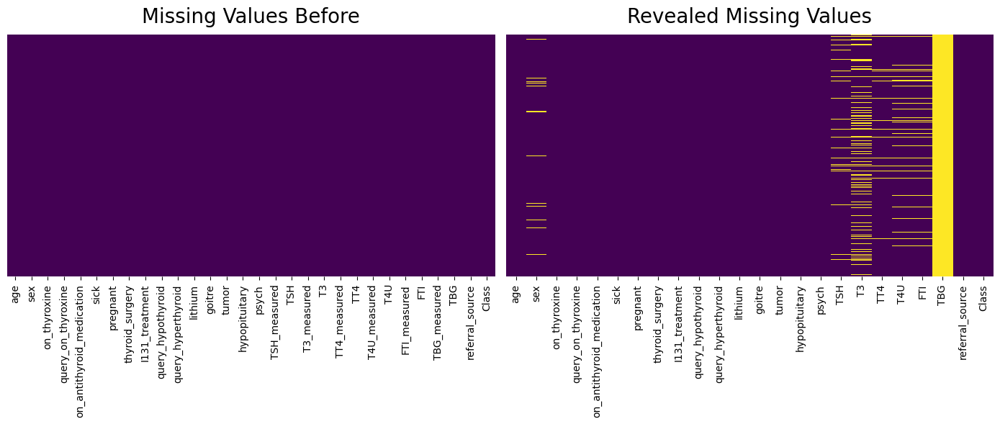

In [35]:
plt.figure(figsize=(14,6), layout="tight")

plt.subplot(1,2,1)
sns.heatmap(df_combined_orig.isnull(), cbar=False, cmap="viridis", yticklabels=False)
plt.title('Missing Values Before', fontdict={'fontsize':20},pad=12)

plt.subplot(1,2,2)
sns.heatmap(df_combined.isnull(), cbar=False, cmap="viridis", yticklabels=False)
plt.title("Revealed Missing Values", fontdict={'fontsize':20},pad=12)
plt.show()

> <span style='color:red; font-weight:bold'>The entire Column "TBG" has NaN values so drop it</span>

In [36]:
#df_combined_orig[df_combined.age=='455']

In [37]:
df_combined = df_combined.drop(["TBG"], axis=1)
df_combined.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,referral_source,Class
0,41,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,1.3,2.5,125,1.14,109,SVHC,negative
1,23,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,4.1,2,102,NaN,NaN,other,negative
2,46,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,0.98,NaN,109,0.91,120,other,negative
3,70,F,t,f,f,f,f,f,f,f,f,f,f,f,f,f,0.16,1.9,175,NaN,NaN,other,negative
4,70,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,0.72,1.2,61,0.87,70,SVI,negative


# Data Type

In [38]:
df_combined.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,referral_source,Class
0,41,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,1.3,2.5,125,1.14,109,SVHC,negative
1,23,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,4.1,2,102,NaN,NaN,other,negative
2,46,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,0.98,NaN,109,0.91,120,other,negative
3,70,F,t,f,f,f,f,f,f,f,f,f,f,f,f,f,0.16,1.9,175,NaN,NaN,other,negative
4,70,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,0.72,1.2,61,0.87,70,SVI,negative


In [39]:
df_combined.dtypes;

In [40]:
columns_float = ['age', 'TSH', 'T3', 'TT4','T4U', 'FTI']

for column in columns_float:
    df_combined[column] = df_combined[column].astype(float)

df_combined.dtypes

age                          float64
sex                           object
on_thyroxine                  object
query_on_thyroxine            object
on_antithyroid_medication     object
sick                          object
pregnant                      object
thyroid_surgery               object
I131_treatment                object
query_hypothyroid             object
query_hyperthyroid            object
lithium                       object
goitre                        object
tumor                         object
hypopituitary                 object
psych                         object
TSH                          float64
T3                           float64
TT4                          float64
T4U                          float64
FTI                          float64
referral_source               object
Class                         object
dtype: object

# Additional Cleaning

In [41]:
df_combined_orig[df_combined_orig["TSH"] != "?"][["TSH"]].astype(float).describe()

,TSH
count,4348.000000
mean,7.141470
std,30.516099
min,0.005000
25%,0.407500
50%,1.400000
75%,3.300000
max,530.000000


In [42]:
#df_combined_orig[df_combined.age==455] 

df_combined['age'] = df_combined[["age"]].replace(455.0, float(df_combined['age'].mode()))

In [43]:
df_combined[df_combined.age==455.0] 

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,referral_source,Class


# Percentage of Missing values and Their Impact on Target Variable

In [44]:
features_with_NaN = [feature for feature in df_combined.columns if df_combined[feature].isnull().sum() > 0]
features_with_NaN

['age', 'sex', 'TSH', 'T3', 'TT4', 'T4U', 'FTI']

In [45]:
for feature in features_with_NaN:
    print(feature,np.round(df_combined[feature].isnull().mean()*100,5), '% missing values')

age 0.02109 % missing values
sex 3.92322 % missing values
TSH 8.28939 % missing values
T3 19.00443 % missing values
TT4 4.99895 % missing values
T4U 9.15419 % missing values
FTI 9.112 % missing values


In [46]:
list(df_combined['Class'].unique())

['negative',
 'increased binding protein',
 'decreased binding protein',
 'compensated hypothyroid',
 'primary hypothyroid',
 'secondary hypothyroid',
 'hyperthyroid',
 'T toxic',
 'goitre',
 'secondary toxic',
 'replacement therapy',
 'underreplacement',
 'overreplacement',
 'sick',
 'discordant']

> Strong impact of missing values can be seen on target variable so we nd to carefully handle the missing values i.e replace them appropriatly

# Missing Values Impution

In [47]:
df_combined.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,referral_source,Class
0,41.0,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,1.30,2.5,125.0,1.14,109.0,SVHC,negative
1,23.0,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,4.10,2.0,102.0,NaN,NaN,other,negative
2,46.0,M,f,f,f,f,f,f,f,f,f,f,f,f,f,f,0.98,NaN,109.0,0.91,120.0,other,negative
3,70.0,F,t,f,f,f,f,f,f,f,f,f,f,f,f,f,0.16,1.9,175.0,NaN,NaN,other,negative
4,70.0,F,f,f,f,f,f,f,f,f,f,f,f,f,f,f,0.72,1.2,61.0,0.87,70.0,SVI,negative


In [48]:
df_combined["sex"].mode()

0    F
Name: sex, dtype: object

In [49]:
from sklearn.impute import SimpleImputer

In [50]:
df_combined['sex'] = SimpleImputer(missing_values=np.nan, strategy="most_frequent").fit_transform(df_combined[["sex"]].values)

In [51]:
df_combined['age'] = SimpleImputer(missing_values=np.nan, strategy="most_frequent").fit_transform(df_combined[["age"]].values)

df_combined['TSH'] = SimpleImputer(missing_values=np.nan, strategy="median").fit_transform(df_combined[["TSH"]].values)
df_combined['T3'] = SimpleImputer(missing_values=np.nan, strategy="median").fit_transform(df_combined[["T3"]].values)
df_combined['TT4'] = SimpleImputer(missing_values=np.nan, strategy="median").fit_transform(df_combined[["TT4"]].values)
df_combined['T4U'] = SimpleImputer(missing_values=np.nan, strategy="median").fit_transform(df_combined[["T4U"]].values)
df_combined['FTI'] = SimpleImputer(missing_values=np.nan, strategy="median").fit_transform(df_combined[["FTI"]].values)

In [52]:
df_combined.shape

(4741, 23)

In [53]:
df_combined.isnull().sum()

age                          0
sex                          0
on_thyroxine                 0
query_on_thyroxine           0
on_antithyroid_medication    0
sick                         0
pregnant                     0
thyroid_surgery              0
I131_treatment               0
query_hypothyroid            0
query_hyperthyroid           0
lithium                      0
goitre                       0
tumor                        0
hypopituitary                0
psych                        0
TSH                          0
T3                           0
TT4                          0
T4U                          0
FTI                          0
referral_source              0
Class                        0
dtype: int64

# Handling Categorical Features

> Features having upto 6 uniqu values will be imputed by using map() and features with more number of unique values ill be treated with dummies()

In [54]:
df_combined_plot = df_combined.copy()

In [55]:
columns_list = df_combined.columns.to_list()
columns_list

['age',
 'sex',
 'on_thyroxine',
 'query_on_thyroxine',
 'on_antithyroid_medication',
 'sick',
 'pregnant',
 'thyroid_surgery',
 'I131_treatment',
 'query_hypothyroid',
 'query_hyperthyroid',
 'lithium',
 'goitre',
 'tumor',
 'hypopituitary',
 'psych',
 'TSH',
 'T3',
 'TT4',
 'T4U',
 'FTI',
 'referral_source',
 'Class']

In [56]:
df_combined.describe()

,age,TSH,T3,TT4,T4U,FTI
count,4741.000000,4741.000000,4741.000000,4741.000000,4741.000000,4741.000000
mean,51.921114,6.665537,1.998701,109.390972,0.998429,111.098165
std,19.157005,29.266519,0.870166,39.892980,0.206035,36.563230
min,1.000000,0.005000,0.050000,2.000000,0.250000,2.000000
25%,36.000000,0.500000,1.600000,87.000000,0.880000,93.000000
50%,55.000000,1.400000,2.000000,104.000000,0.970000,107.000000
75%,68.000000,3.000000,2.300000,127.000000,1.080000,124.000000
max,94.000000,530.000000,10.600000,430.000000,2.320000,395.000000


In [57]:
columns_list = df_combined.columns.to_list()

for feature in columns_list:
    if len(df_combined[feature].unique())<=3:
        value1 = df_combined[feature].unique()[0]
        value2 = df_combined[feature].unique()[1]
        df_combined[feature] = df_combined[feature].map({f'{value1}':0,f'{value2}':1})
        print(feature, df_combined[feature].unique())

sex [0 1]
on_thyroxine [0 1]
query_on_thyroxine [0 1]
on_antithyroid_medication [0 1]
sick [0 1]
pregnant [0 1]
thyroid_surgery [0 1]
I131_treatment [0 1]
query_hypothyroid [0 1]
query_hyperthyroid [0 1]
lithium [0 1]
goitre [0 1]
tumor [0 1]
hypopituitary [0 1]
psych [0 1]


In [58]:
df_combined = pd.get_dummies(data  = df_combined, columns=['referral_source'], drop_first=True)
df_combined.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,Class,referral_source_SVHC,referral_source_SVHD,referral_source_SVI,referral_source_other
0,41.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.30,2.5,125.0,1.14,109.0,negative,1,0,0,0
1,23.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4.10,2.0,102.0,0.97,107.0,negative,0,0,0,1
2,46.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.98,2.0,109.0,0.91,120.0,negative,0,0,0,1
3,70.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.16,1.9,175.0,0.97,107.0,negative,0,0,0,1
4,70.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.72,1.2,61.0,0.87,70.0,negative,0,0,1,0


In [59]:
df_combined["Class"] = LabelEncoder().fit_transform(df_combined["Class"])
df_combined.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,Class,referral_source_SVHC,referral_source_SVHD,referral_source_SVI,referral_source_other
0,41.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.30,2.5,125.0,1.14,109.0,7,1,0,0,0
1,23.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4.10,2.0,102.0,0.97,107.0,7,0,0,0,1
2,46.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.98,2.0,109.0,0.91,120.0,7,0,0,0,1
3,70.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.16,1.9,175.0,0.97,107.0,7,0,0,0,1
4,70.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.72,1.2,61.0,0.87,70.0,7,0,0,1,0


# EDA 1

<Axes: xlabel='sex', ylabel='count'>

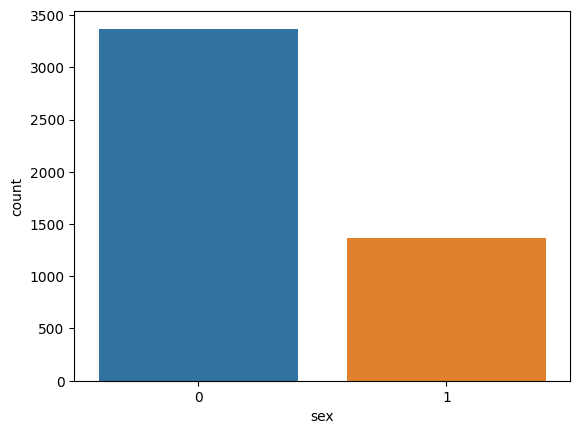

In [60]:
sns.countplot(df_combined,x= 'sex')

In [61]:
fig = px.box(data_frame=df_combined_orig,x='Class',y=df_combined['TSH'],height=500)
fig.update_layout(height=400,width=1200,showlegend=True,
                  paper_bgcolor = "rgba(0,0,0,0)",
                  plot_bgcolor = "rgba(0,0,0,0)",                  
                 )
fig.update_yaxes(showline=True,showgrid=False,linecolor='#d9dadb')
#fig.update_xaxes(showline=True,showgrid=False,linecolor='#d9dadb')
fig.show()
#pio.write_html(fig,file = '../RawData_EDA_Report/1.html')

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

In [ ]:
import plotly.graph_objs as go
import plotly.subplots as sp
import plotly.express as px
import plotly.io as pio
import pandas as pd

df_combined_orig[df_combined_orig["TSH"] != "?"][["TSH"]].astype(float)

# Define the number of rows and columns for the subplot grid
num_rows = 2
num_cols = 3

# Create a subplot grid with the specified number of rows and columns
fig = sp.make_subplots(rows=num_rows, cols=num_cols,subplot_titles=['age', 'TSH', 'T3', 'TT4', 'T4U', 'FTI'])

# Loop through each column in the dataframe and add a box plot to the subplot grid
for idx, col_name in enumerate(['age', 'TSH', 'T3', 'TT4', 'T4U', 'FTI']):
    row_num = (idx // num_cols) + 1
    col_num = (idx % num_cols) + 1
    
    fig.add_trace(px.box(df_combined_orig[df_combined_orig[col_name] != "?"][[col_name]].astype(float)).data[0], row=row_num, col=col_num,)

    # Set the title of the subplot grid
    fig.update_layout(height=500,width=1100, title='Before Handling Outliers and Missing Value Imputation [Missing Values Omitted]',
                      paper_bgcolor = "rgba(0,0,0,0)",
                      plot_bgcolor = "rgba(0,0,0,0)",                  
                     )
    fig.update_traces(marker_color='green')
# Show the plot

###############################
fig.update_yaxes(showline=False,showgrid=False)
fig.update_xaxes(showline=False,showgrid=False)
fig.show()
##########################################
#pio.write_html(fig,file = '../RawData_EDA_Report/6.html')

In [ ]:
import plotly.graph_objs as go
import plotly.subplots as sp
import plotly.express as px
import plotly.io as pio
import pandas as pd


# Define the number of rows and columns for the subplot grid
num_rows = 2
num_cols = 3

# Create a subplot grid with the specified number of rows and columns
fig = sp.make_subplots(rows=num_rows, cols=num_cols,subplot_titles=['age', 'TSH', 'T3', 'TT4', 'T4U', 'FTI'])

# Loop through each column in the dataframe and add a box plot to the subplot grid
for idx, col_name in enumerate(['age', 'TSH', 'T3', 'TT4', 'T4U', 'FTI']):
    row_num = (idx // num_cols) + 1
    col_num = (idx % num_cols) + 1
    fig.add_trace(px.box(df_combined[col_name]).data[0], row=row_num, col=col_num,)

    # Set the title of the subplot grid
    fig.update_layout(height=500,width=1100, title='Before Handling Outliers and After Missing Value Imputation',
                      paper_bgcolor = "rgba(0,0,0,0)",
                      plot_bgcolor = "rgba(0,0,0,0)",                  
                     )
    fig.update_traces(marker_color='green')
# Show the plot

###############################
fig.update_yaxes(showline=False,showgrid=False)
fig.update_xaxes(showline=False,showgrid=False)
fig.show()
##########################################
#pio.write_html(fig,file = '../RawData_EDA_Report/6.html')

# Outliers Handling

In [ ]:
def outliers_fence(col):
    Q1 = df_combined[col].quantile(q=0.25)
    Q3 = df_combined[col].quantile(q=0.75)
    IQR = Q3 - Q1

    lower_fence = Q1 - 1.5*IQR
    upper_fence = Q3 + 1.5*IQR
    return lower_fence, upper_fence

In [ ]:
lower_fence1, upper_fence1 = outliers_fence(col='TSH')
lower_fence2, upper_fence2 = outliers_fence(col='T3')
lower_fence3, upper_fence3 = outliers_fence(col='TT4')
lower_fence4, upper_fence4 = outliers_fence(col='T4U')
lower_fence5, upper_fence5 = outliers_fence(col='FTI')

In [ ]:
# Winsorize the data just replace outliers with corresponding fence

df_combined['TSH'] = np.where(df_combined["TSH"] < lower_fence1, lower_fence1, df_combined["TSH"])
df_combined["TSH"] = np.where(df_combined["TSH"] > upper_fence1, upper_fence1, df_combined["TSH"])

df_combined['T3'] = np.where(df_combined["T3"] < lower_fence2, lower_fence2, df_combined["T3"])
df_combined["T3"] = np.where(df_combined["T3"] > upper_fence2, upper_fence2, df_combined["T3"])

df_combined['TT4'] = np.where(df_combined["TT4"] < lower_fence3, lower_fence3, df_combined["TT4"])
df_combined["TT4"] = np.where(df_combined["TT4"] > upper_fence3, upper_fence3, df_combined["TT4"])

df_combined['T4U'] = np.where(df_combined["T4U"] < lower_fence4, lower_fence4, df_combined["T4U"])
df_combined["T4U"] = np.where(df_combined["T4U"] > upper_fence4, upper_fence4, df_combined["T4U"])

df_combined['FTI'] = np.where(df_combined["FTI"] < lower_fence5, lower_fence5, df_combined["FTI"])
df_combined["FTI"] = np.where(df_combined["FTI"] > upper_fence5, upper_fence5, df_combined["FTI"])



In [ ]:
df_combined.shape

(4741, 26)

In [ ]:
import plotly.graph_objs as go
import plotly.subplots as sp
import plotly.express as px
import plotly.io as pio
import pandas as pd


# Define the number of rows and columns for the subplot grid
num_rows = 2
num_cols = 3

# Create a subplot grid with the specified number of rows and columns
fig = sp.make_subplots(rows=num_rows, cols=num_cols,subplot_titles=['age', 'TSH', 'T3', 'TT4', 'T4U', 'FTI'])

# Loop through each column in the dataframe and add a box plot to the subplot grid
for idx, col_name in enumerate(['age', 'TSH', 'T3', 'TT4', 'T4U', 'FTI']):
    row_num = (idx // num_cols) + 1
    col_num = (idx % num_cols) + 1
    fig.add_trace(px.box(df_combined[col_name]).data[0], row=row_num, col=col_num,)

    # Set the title of the subplot grid
    fig.update_layout(height=500,width=1100, title='After Handling Outliers and After Missing Value Imputation',
                      paper_bgcolor = "rgba(0,0,0,0)",
                      plot_bgcolor = "rgba(0,0,0,0)",                  
                     )
    fig.update_traces(marker_color='green')
# Show the plot

###############################
fig.update_yaxes(showline=False,showgrid=False)
fig.update_xaxes(showline=False,showgrid=False)
fig.show()
##########################################
#pio.write_html(fig,file = '../RawData_EDA_Report/6.html')

# EDA 2

In [64]:
df_combined_plot['Class'].unique()

array(['negative', 'increased binding protein',
       'decreased binding protein', 'compensated hypothyroid',
       'primary hypothyroid', 'secondary hypothyroid', 'hyperthyroid',
       'T toxic', 'goitre', 'secondary toxic', 'replacement therapy',
       'underreplacement', 'overreplacement', 'sick', 'discordant'],
      dtype=object)

In [66]:
df_combined_class_labels = df_combined.copy()
df_combined_class_labels["Class_label"] = df_combined_plot['Class'] 



In [67]:
df_combined_class_labels

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,Class,referral_source_SVHC,referral_source_SVHD,referral_source_SVI,referral_source_other,Class_label
0,41.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.30,2.5,125.0,1.14,109.0,7,1,0,0,0,negative
1,23.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4.10,2.0,102.0,0.97,107.0,7,0,0,0,1,negative
2,46.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.98,2.0,109.0,0.91,120.0,7,0,0,0,1,negative
3,70.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.16,1.9,175.0,0.97,107.0,7,0,0,0,1,negative
4,70.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.72,1.2,61.0,0.87,70.0,7,0,0,1,0,negative
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
652,31.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.40,2.5,165.0,0.90,184.0,3,0,0,0,0,discordant
722,29.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.25,2.0,35.0,0.97,107.0,3,1,0,0,0,discordant
805,58.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.50,3.4,91.0,0.97,94.0,3,0,0,1,0,discordant
819,7.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.40,2.3,54.0,0.86,63.0,3,0,0,0,1,discordant


In [68]:
df = df_combined_class_labels
# Define the major class conditions
conditions = [
    df['Class_label'].isin(['compensated hypothyroid', 'primary hypothyroid', 'secondary hypothyroid']),
    df['Class_label'].isin(['hyperthyroid', 'T toxic', 'secondary toxic']),
    df['Class_label'].isin(['replacement therapy', 'underreplacement', 'overreplacement']),
    df['Class_label'].isin(['goitre']),
    df['Class_label'].isin(['increased binding protein', 'decreased binding protein']),
    df['Class_label'].isin(['sick']),
    df['Class_label'].isin(['discordant'])
]

# Define the major class labels
class_labels = [
    'hypothyroid',
    'hyperthyroid',
    'replacement therapy',
    'goitre',
    'binding protein',
    'sick',
    'discordant'
]

# Add the major class column to the dataframe based on the conditions
df['major_class'] = np.select(conditions, class_labels, default='negative')
df.drop("Class_label", axis=1, inplace=True)
df_combined_grouped = df.copy()

In [69]:
df_combined_grouped.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,Class,referral_source_SVHC,referral_source_SVHD,referral_source_SVI,referral_source_other,major_class
0,41.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.30,2.5,125.0,1.14,109.0,7,1,0,0,0,negative
1,23.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4.10,2.0,102.0,0.97,107.0,7,0,0,0,1,negative
2,46.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.98,2.0,109.0,0.91,120.0,7,0,0,0,1,negative
3,70.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.16,1.9,175.0,0.97,107.0,7,0,0,0,1,negative
4,70.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.72,1.2,61.0,0.87,70.0,7,0,0,1,0,negative


In [70]:
df_combined_grouped.groupby('major_class').count()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,Class,referral_source_SVHC,referral_source_SVHD,referral_source_SVI,referral_source_other
major_class,,,,,,,,,,,,,,,,,,,,,,,,,,
binding protein,163,163,163,163,163,163,163,163,163,163,163,163,163,163,163,163,163,163,163,163,163,163,163,163,163,163
discordant,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58,58
goitre,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12,12
hyperthyroid,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90,90
hypothyroid,291,291,291,291,291,291,291,291,291,291,291,291,291,291,291,291,291,291,291,291,291,291,291,291,291,291
negative,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772,3772
replacement therapy,124,124,124,124,124,124,124,124,124,124,124,124,124,124,124,124,124,124,124,124,124,124,124,124,124,124
sick,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231,231


In [73]:
fig = px.pie(df_combined_grouped,names='major_class', hole=0.3)

fig.update_layout(title="Percentage Share of Major Classes",
                  height=800,
                  width = 800,
                  paper_bgcolor = "rgba(0,0,0,0)",
                  plot_bgcolor = "rgba(0,0,0,0)",

        #annotations = [dict(text="Class".title(), showarrow=False)],
        margin_autoexpand=True,

        legend=dict(yanchor="bottom",
                                  y=-0.5,
                                  xanchor="center",
                                  x=0.5,
                                  orientation='h'),
        autosize=True)
fig.show()

In [74]:
fig = px.pie(df_combined_plot,names='Class', hole=0.3)

fig.update_layout(title="Percentage Share of Each Class of Target Variable",
                  height=800,
                  width = 800,
                  paper_bgcolor = "rgba(0,0,0,0)",
                  plot_bgcolor = "rgba(0,0,0,0)",

        #annotations = [dict(text="Class".title(), showarrow=False)],
        margin_autoexpand=True,

        legend=dict(yanchor="bottom",
                                  y=-0.5,
                                  xanchor="center",
                                  x=0.5,
                                  orientation='h'),
        autosize=True)
fig.show()

In [75]:
fig = px.histogram(df_combined_plot, x='sex',color='sex', histfunc="count")
fig.update_layout(height=400,width=500, title='Count Plot For Gender',
                      paper_bgcolor = "rgba(0,0,0,0)",
                      plot_bgcolor = "rgba(0,0,0,0)",                  
                     )
fig.show()

In [76]:
col1 = ['sex','on_thyroxine','query_on_thyroxine','on_antithyroid_medication','sick','pregnant','thyroid_surgery']
col2 = [ 'I131_treatment','query_hypothyroid','query_hyperthyroid','lithium','goitre','tumor','hypopituitary','psych']

#df = df_combined[cols]


for col in df_combined_plot[col1].columns:
    for row in df_combined_plot[col2].columns:
        if col != row:

            fig = px.pie(df_combined_plot,names='Class',facet_col=col,facet_row=row, hole=0.3)

            fig.update_layout(
                    height=1000,
                    width = 1000,
                    paper_bgcolor = "rgba(0,0,0,0)",
                    plot_bgcolor = "rgba(0,0,0,0)",

                    #annotations = [dict(text="Class".title(), showarrow=False)],
                    margin_autoexpand=True,

                    legend=dict(yanchor="bottom",
                                              y=-0.5,
                                              xanchor="center",
                                              x=0.5,
                                              orientation='h'),
                    autosize=True)
            fig.show()

In [77]:
df_combined.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,Class,referral_source_SVHC,referral_source_SVHD,referral_source_SVI,referral_source_other
0,41.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.30,2.5,125.0,1.14,109.0,7,1,0,0,0
1,23.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4.10,2.0,102.0,0.97,107.0,7,0,0,0,1
2,46.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.98,2.0,109.0,0.91,120.0,7,0,0,0,1
3,70.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.16,1.9,175.0,0.97,107.0,7,0,0,0,1
4,70.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.72,1.2,61.0,0.87,70.0,7,0,0,1,0


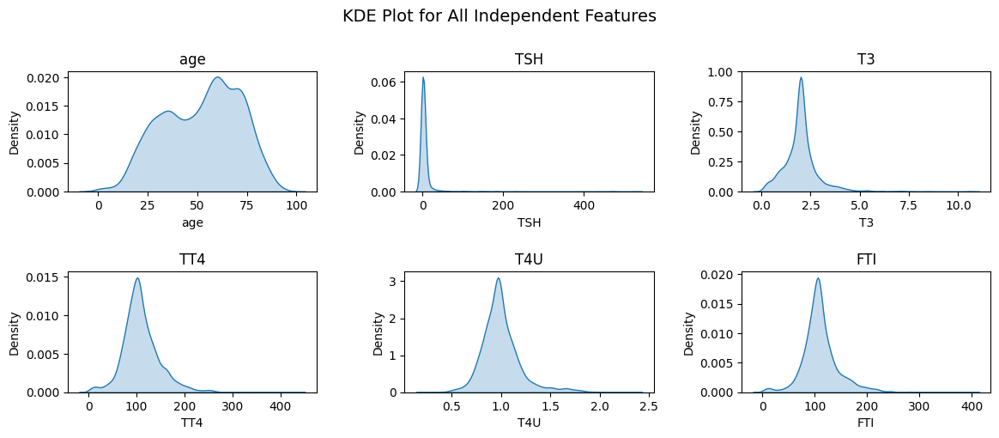

In [78]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

col1 = ['sex','on_thyroxine','query_on_thyroxine','on_antithyroid_medication','sick','pregnant','thyroid_surgery',
        'I131_treatment','query_hypothyroid','query_hyperthyroid','lithium','goitre','tumor','hypopituitary','psych',
        'referral_source', "Class"]
#col2 = [ 'I131_treatment','query_hypothyroid','query_hyperthyroid','lithium','goitre','tumor','hypopituitary','psych']

# generate a sample dataframe
df = df_combined_plot.drop(col1,axis=1)

# create figure and axes objects
fig, axes = plt.subplots(nrows=5, ncols=3, squeeze=True,figsize=(12, 12))

# flatten the axes array for easy indexing
axes = axes.flatten()

# loop through each column and plot the kde on a separate axis
for i, col in enumerate(df.columns):
    sns.kdeplot(df[col], ax=axes[i], fill=True)
    axes[i].set_title(col)

# remove any unused axes and add a main title
for i in range(len(df.columns), len(axes)):
    fig.delaxes(axes[i])
fig.suptitle('KDE Plot for All Independent Features', fontsize=14)

# adjust the spacing between the subplots and show the figure
fig.tight_layout(pad=2)
plt.show()

#############################################
#fig.figure.savefig('../RawData_EDA_Report/5.svg',transparent=True,dpi=300)


# Resampling of data

In [79]:
from imblearn.over_sampling import SMOTENC,RandomOverSampler,KMeansSMOTE

> In the code above, X and y are your input features and target variable, respectively. SMOTENC is used to oversample the categorical features specified in categorical_features (the indices of categorical columns). RandomOverSampler and KMeansSMOTE are two different oversampling techniques that can be used as alternatives. The resulting oversampled data are stored in X_resampled_* and y_resampled_*.

In [83]:
df_combined['Class'].unique()

array([ 7,  6,  2,  1,  9, 11,  5,  0,  4, 12, 10, 14,  8, 13,  3])

In [81]:
#df_combined_grouped['Class'].unique()

df_combined_orig['Class'].unique()

array(['negative', 'increased binding protein',
       'decreased binding protein', 'compensated hypothyroid',
       'primary hypothyroid', 'secondary hypothyroid', 'hyperthyroid',
       'T toxic', 'goitre', 'secondary toxic', 'replacement therapy',
       'underreplacement', 'overreplacement', 'sick', 'discordant'],
      dtype=object)

In [80]:
X = df_combined.drop("Class", axis=1)
y = df_combined["Class"]

#X = df_combined.iloc[:, :-1].values # features
#y = df_combined.iloc[:, -1].values # target variable

In [81]:
categorical_features = ['sex','on_thyroxine','query_on_thyroxine','on_antithyroid_medication','sick','pregnant',
                        'thyroid_surgery','I131_treatment','query_hypothyroid','query_hyperthyroid','lithium',
                        'goitre','tumor','hypopituitary','psych']

continuous_features = df_combined.drop(categorical_features, axis=1)

categorical_features_indices = [df_combined.columns.get_loc(col) for col in categorical_features]

In [82]:
# Create an instance of SMOTENC oversampler

smote_nc = SMOTENC(categorical_features = categorical_features_indices, random_state=2023)


# Create an instance of RandomOverSampler
random_over_sampler = RandomOverSampler(random_state=2023)


# Create an instance of KMeansSMOTE
kmeans_smote = KMeansSMOTE(random_state=2023)

In [83]:
# Generate the oversampled data using each of the oversamplers

#X_resampled_smote_nc, y_resampled_smote_nc = smote_nc.fit_resample(X, y)

#X_resampled_kmeans, y_resampled_kmeans = kmeans_smote.fit_resample(X, y)

In [84]:

X_resampled_random, y_resampled_random = random_over_sampler.fit_resample(X, y)


In [85]:
X_resampled_random = pd.DataFrame(data = X_resampled_random, columns = X.columns)

X_resampled_random.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,referral_source_SVHC,referral_source_SVHD,referral_source_SVI,referral_source_other
0,41.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.30,2.5,125.0,1.14,109.0,1,0,0,0
1,23.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4.10,2.0,102.0,0.97,107.0,0,0,0,1
2,46.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.98,2.0,109.0,0.91,120.0,0,0,0,1
3,70.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.16,1.9,175.0,0.97,107.0,0,0,0,1
4,70.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.72,1.2,61.0,0.87,70.0,0,0,1,0


In [86]:
y_resampled_random = pd.DataFrame(y_resampled_random, columns= ["Class"])

In [87]:
X_resampled_random.duplicated().sum()

52871

In [88]:
fig = px.histogram(y_resampled_random, x='Class',color='Class', histfunc="count")
fig.update_layout(height=500,width=500, title='Count Plot For Target Feature',
                      paper_bgcolor = "rgba(0,0,0,0)",
                      plot_bgcolor = "rgba(0,0,0,0)",                  
                     )
fig.show()

In [89]:
fig = px.histogram(X_resampled_random, x='sex',color='sex', histfunc="count")
fig.update_layout(height=500,width=500, title='Count Plot For Target Feature',
                      paper_bgcolor = "rgba(0,0,0,0)",
                      plot_bgcolor = "rgba(0,0,0,0)",                  
                     )
fig.show()

In [90]:
df_resample_random = pd.concat([X_resampled_random,y_resampled_random], axis=1)

df_resample_random.head()

,age,sex,on_thyroxine,query_on_thyroxine,on_antithyroid_medication,sick,pregnant,thyroid_surgery,I131_treatment,query_hypothyroid,query_hyperthyroid,lithium,goitre,tumor,hypopituitary,psych,TSH,T3,TT4,T4U,FTI,referral_source_SVHC,referral_source_SVHD,referral_source_SVI,referral_source_other,Class
0,41.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.30,2.5,125.0,1.14,109.0,1,0,0,0,7
1,23.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4.10,2.0,102.0,0.97,107.0,0,0,0,1,7
2,46.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.98,2.0,109.0,0.91,120.0,0,0,0,1,7
3,70.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.16,1.9,175.0,0.97,107.0,0,0,0,1,7
4,70.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.72,1.2,61.0,0.87,70.0,0,0,1,0,7


In [91]:
X_resampled_random.shape

(56580, 25)

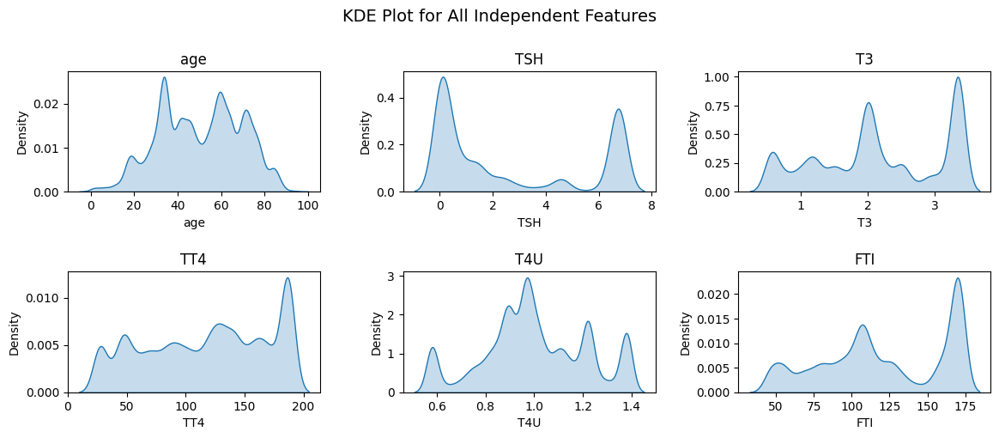

In [92]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

col1 = ['sex','on_thyroxine','query_on_thyroxine','on_antithyroid_medication','sick','pregnant','thyroid_surgery',
        'I131_treatment','query_hypothyroid','query_hyperthyroid','lithium','goitre','tumor','hypopituitary','psych',
        "referral_source_SVHC","referral_source_SVHD","referral_source_SVI","referral_source_other","Class"]
#col2 = [ 'I131_treatment','query_hypothyroid','query_hyperthyroid','lithium','goitre','tumor','hypopituitary','psych']

# generate a sample dataframe
df = df_resample_random.drop(col1,axis=1)

# create figure and axes objects
fig, axes = plt.subplots(nrows=5, ncols=3, squeeze=True,figsize=(12, 12))

# flatten the axes array for easy indexing
axes = axes.flatten()

# loop through each column and plot the kde on a separate axis
for i, col in enumerate(df.columns):
    sns.kdeplot(df[col], ax=axes[i], fill=True)
    axes[i].set_title(col)

# remove any unused axes and add a main title
for i in range(len(df.columns), len(axes)):
    fig.delaxes(axes[i])
fig.suptitle('KDE Plot for All Independent Features', fontsize=14)

# adjust the spacing between the subplots and show the figure
fig.tight_layout(pad=2)
plt.show()

#############################################
#fig.figure.savefig('../RawData_EDA_Report/5.svg',transparent=True,dpi=300)


# Dataset Export

In [93]:
import os

os.makedirs("dataset", exist_ok=True)
df_resample_random.to_csv("dataset/ResampledData.csv",index=False)
df_combined.to_csv("dataset/combined_procssed.csv",index=False)
df_combined_grouped.to_csv("dataset/combined_procssed_grouped.csv",index=False)
df_combined_plot.to_csv("dataset/combine_with_labels.csv",index=False)


# Feature Selection

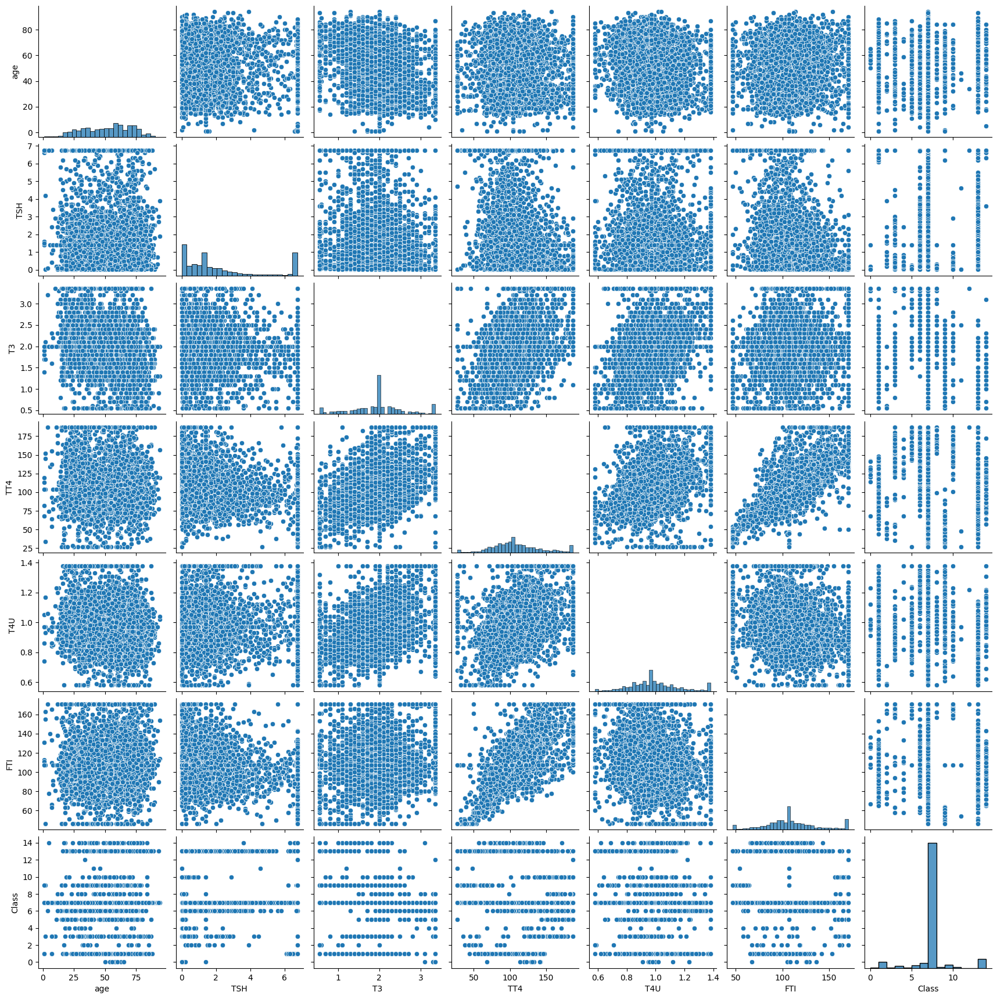

In [94]:
sns.pairplot(df_combined[['age',"TSH","T3","TT4","T4U","FTI","Class"]]);

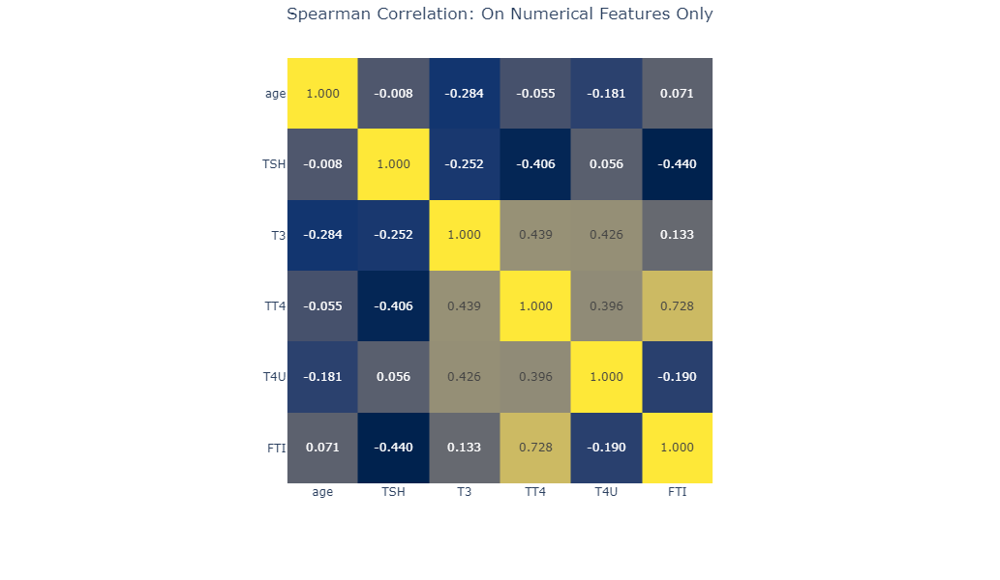

In [95]:
fig = px.imshow(df_combined[['age', 'TSH', 'T3', 'TT4', 'T4U', 'FTI']].corr(method='spearman',numeric_only=True),
                text_auto='.3f',color_continuous_scale='Cividis',
                title='Spearman Correlation: On Numerical Features Only')
fig.update_coloraxes(showscale=False)
fig.update_layout(margin=dict(t=40,pad=0),
                  title_x=0.5,
                  height=600,width=600,
                  paper_bgcolor = "rgba(0,0,0,0)",
                plot_bgcolor = "rgba(0,0,0,0)",                  
                margin_autoexpand=True,
                  font=dict(size = 12)                 
                
                )

fig.update_yaxes(automargin=False)


fig.show()
#############################
#pio.write_html(fig,file = '../RawData_EDA_Report/9.html')

In [ ]:
categorical_features.append("Class")

In [99]:
import scipy.stats as stats
from scipy.stats import chi2_contingency
from scipy.stats import chi2
import os
####################################################

#categorical_features.append("Class")

#####################################################
alpha= 0.01
CI = 0.99
outputs = []

#################### CLEANING THE FILE ################################
#try:
#    with open('../RawData_EDA_Report/Chi2Test/Chi2Test_for_associaion.html', 'w') as file:
#        file.write('')
#except:
#    pass
######################################################
for col in df_combined_plot[categorical_features].drop(['Class'],axis=1).columns:

    observed_freq = pd.crosstab(df_combined_plot[categorical_features]['Class'],df_combined_plot[categorical_features][col])
    chi2_stat, p_value, dof,expected_freq = chi2_contingency(observed = observed_freq,correction=True)
    critical_value=chi2.ppf(q=1-alpha,df=dof)
    
    if chi2_stat>=critical_value:
        print(f"Reject H0 at CI {CI}, p-value {round(p_value,4)}, critical value {round(critical_value,4)} and chi2_stat {round(chi2_stat,4)}:\nThere is a relationship between {'Classes'.upper()} and {col.upper()} variables \n")
        output = f"<ul> Reject H0 at CI {CI}, p-value {round(p_value,4)}, critical value {round(critical_value,4)} and chi2_stat {round(chi2_stat,4)}:\nThere is a relationship between {'Classes'.upper()} and {col.upper()} variables</ul> \n"
    else:
        print(f"Retain H0 at CI {CI}, p-value {round(p_value,4)} and critical value {round(critical_value,4)} and chi2_stat {round(chi2_stat,4)}:\nThere is no relationship between {'Classes'.upper()} and {col.upper()} variables \n")
        output = f"<ul>Retain H0 at CI {CI}, p-value {round(p_value,4)} and critical value {round(critical_value,4)} and chi2_stat {round(chi2_stat,4)}:\nThere is no relationship between {'Classes'.upper()} and {col.upper()} variables</ul> \n"
    
    outputs.append(output)

# Write the outputs to the file

#if not os.path.exists(f'../RawData_EDA_Report/9_1_Chi2Test'):
#    os.makedirs(f'../RawData_EDA_Report/9_1_Chi2Test')
    
#with open('../RawData_EDA_Report/9_1_Chi2Test/9_1_Chi2Test_for_associaion.html','a') as file:
#    file.write("<h1>Chi2 Test for Association/ Independence Detection</h1><uol>")
#    for output in outputs:
#        file.write(f"<p  style='text-align: justify; margin-left=50px'>{output}</uol>\n</p>")
        

Reject H0 at CI 0.99, p-value 0.0, critical value 29.1412 and chi2_stat 77.3893:
There is a relationship between CLASSES and SEX variables 

Reject H0 at CI 0.99, p-value 0.0, critical value 29.1412 and chi2_stat 878.6141:
There is a relationship between CLASSES and ON_THYROXINE variables 

Retain H0 at CI 0.99, p-value 0.9599 and critical value 29.1412 and chi2_stat 6.245:
There is no relationship between CLASSES and QUERY_ON_THYROXINE variables 

Reject H0 at CI 0.99, p-value 0.0, critical value 29.1412 and chi2_stat 135.4208:
There is a relationship between CLASSES and ON_ANTITHYROID_MEDICATION variables 

Reject H0 at CI 0.99, p-value 0.0001, critical value 29.1412 and chi2_stat 42.5616:
There is a relationship between CLASSES and SICK variables 

Reject H0 at CI 0.99, p-value 0.0, critical value 29.1412 and chi2_stat 454.0154:
There is a relationship between CLASSES and PREGNANT variables 

Retain H0 at CI 0.99, p-value 0.3813 and critical value 29.1412 and chi2_stat 14.9535:
Ther